In [350]:
import cv2
import pandas as pd
import numpy as np
import os
import math
import json

from pdf2image import convert_from_path
from PIL import Image
from matplotlib import pyplot as plt

origin_pdf_dir = './scan/datas/240718_좌표용_testPDF/300dpi'   # PDF 파일이 있는 폴더 경로
pdf_to_divied_jpg_dir = origin_pdf_dir + "/divided"              # pdf를 n개 쪽의 jpg로 저장할(된) 디렉토리
divied_jpg_crop_from_vertex_dir = origin_pdf_dir + "/square"    # n개쪽의 jpg들을 꼭지점 네모를 기준으로 잘라 저장할(된) 디렉토리
draw_sertors_and_circles_dir = origin_pdf_dir + "/circles"      # 동그라미 검출 이미지를 저장할 폴더 경로

project_dict = {'5537' : "MIT(중등)",
                '5539' : "MIT(고등)",
                '5541' : "CLS(초등)",
                '5543' : "CLS(중등)",
                '5545' : "POWER",
                '5547' : "FIT"}

5547_1.jpg
1


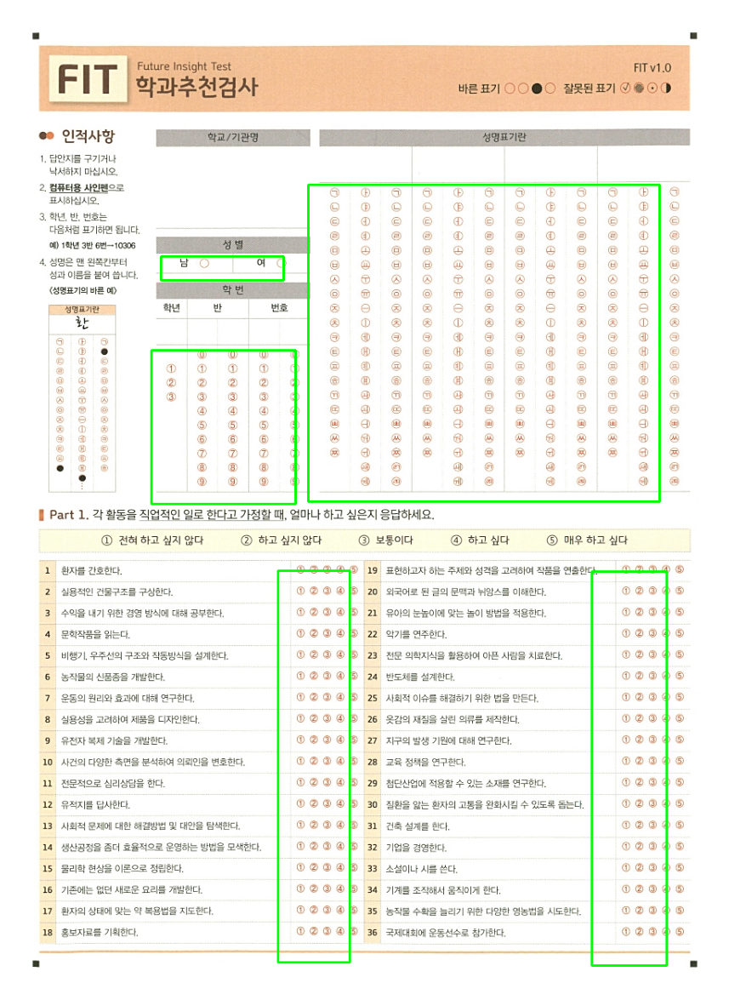

5547_2.jpg
2


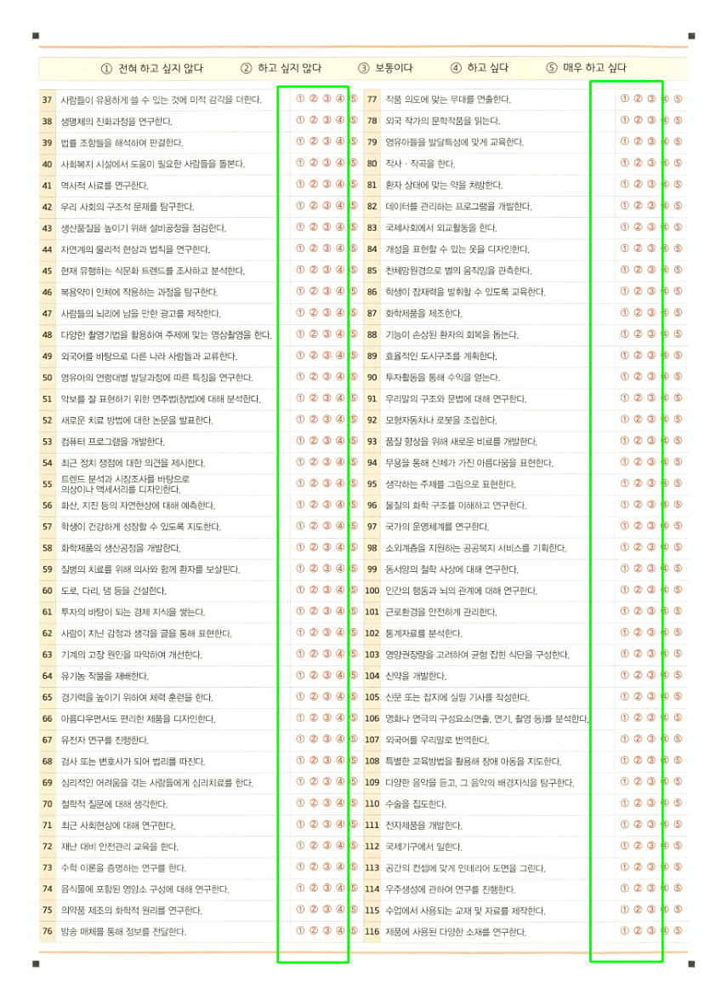

5547_3.jpg
3


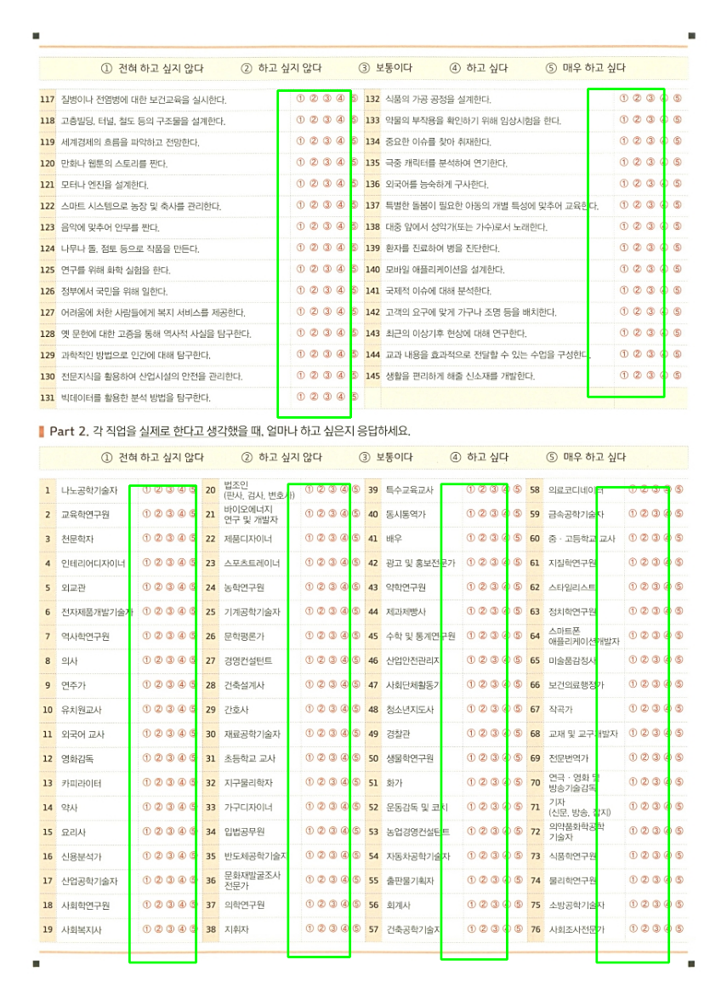

5547_4.jpg
4


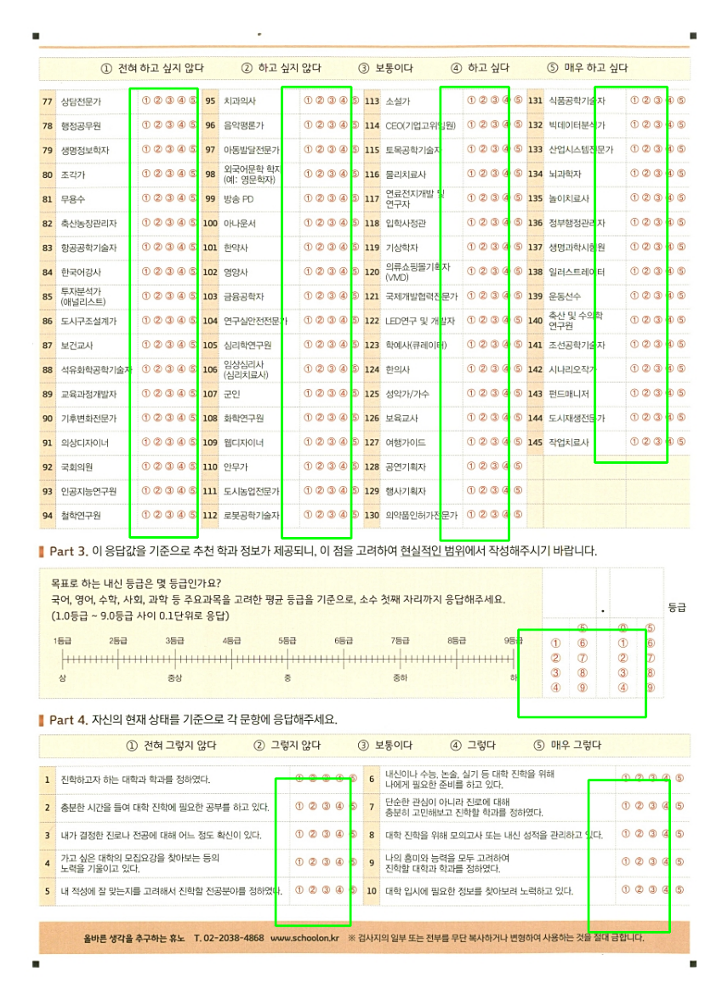

In [160]:
rects_point_dict = dict()
rects_point_dict['FIT'] = \
    {1: [[191, 311, 345, 341, [0], 'A', ['남'], 'gender', [0, 0]], [179, 429, 360, 622, [4], 'A', [1, '.', 0, 0, '.', 0, 0], 'pid', [0, 0]], [376, 221, 817, 619, [3], 'A', [], 'name', [0, 0]], [338, 706, 428, 1198, [0], 'part1', ['1'], '', [0, 0]], [732, 707, 826, 1202, [0], 'part1', ['1'], '', [0, 0]]], 
    2: [[339, 98, 428, 1202, [0], 'part1', ['1'], '', [0, 0]], [733, 91, 824, 1201, [0], 'part1', ['1'], '', [0, 0]]], 
    3: [[339, 103, 431, 515, [0], 'part1', ['1'], '', [0, 0]], [730, 101, 826, 489, [0], 'part1', ['1'], '', [0, 0]], [152, 601, 236, 1202, [0], 'part2', ['1'], '', [0, 0]], [352, 599, 430, 1195, [0], 'part2', ['1'], '', [0, 0]], [545, 599, 628, 1198, [0], 'part2', ['1'], '', [0, 0]], [741, 603, 832, 1202, [0], 'part2', ['1'], '', [0, 0]]], 
    4: [[152, 100, 237, 664, [0], 'part2', ['1'], '', [0, 0]], [343, 98, 430, 665, [0], 'part2', ['1'], '', [0, 0]], [542, 98, 628, 668, [0], 'part2', ['1'], '', [0, 0]], [736, 98, 827, 570, [0], 'part2', ['1'], '', [0, 0]], [640, 780, 800, 890, [0, 9, 10], 'part3', ['0', '1'], '', [0, 0]], [335, 967, 429, 1152, [0], 'part4', ['1'], '', [0, 0]], [728, 969, 830, 1160, [0], 'part4', ['1'], '', [0, 0]]]}
        
        
image_folder = divied_jpg_crop_from_vertex_dir+"_bordered"
for filename in os.listdir(image_folder):
    if (filename.endswith('.jpg')) and ("_page" not in filename) and ("5547" in filename):
        print(filename)
        image_path = os.path.join(image_folder, filename)
        img = cv2.imread(image_path)
        num = int(filename.replace(".jpg", "")[-1])
        print(num)
        for x,y,xw,yh,_,_,_,_,_ in rects_point_dict['FIT'][num]:
            start_point = (x,y)
            end_point = (xw,yh)
            color = (0, 255, 0)  # 사각형 색상 (B, G, R) 형식
            thickness = 2  # 사각형 선 두께
            cv2.rectangle(img, start_point, end_point, color, thickness)
        plt.figure(figsize=(15, 15))
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.axis('off')
        plt.show()

./scan/datas/240718_좌표용_testPDF/300dpi/divided/5547_1.jpg


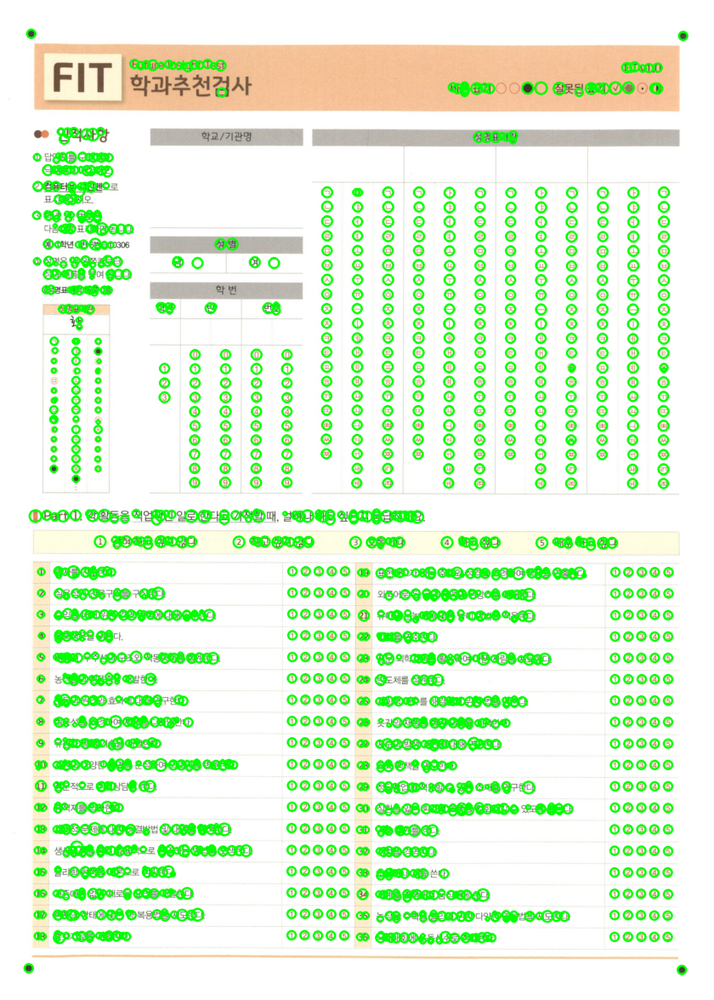

In [357]:
# 이미지 읽기
def process_image(image_path):
    # 이미지 읽기
    image = cv2.imread(image_path)
    # BGR을 HSV로 변환
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    
    # 주황색 범위 설정 (이 범위는 필요에 따라 조정 가능)
    lower_orange = np.array([5, 25, 25])
    upper_orange = np.array([15, 255, 255])
    
    # 주황색 마스크 생성
    mask = cv2.inRange(hsv, lower_orange, upper_orange)
    
    # 결과 이미지 초기화 (모두 흰색)
    result = np.full_like(image, 255)
    
    # 주황색 부분만 원본 이미지에서 복사
    result[mask > 0] = image[mask > 0]
    
    # 이미지를 BGR에서 RGB로 변환 (matplotlib로 표시하기 위해)
    result_rgb = cv2.cvtColor(result, cv2.COLOR_BGR2RGB)
    # # 이미지 표시
    plt.figure(figsize=(15, 15))
    plt.imshow(result_rgb)
    plt.axis('off')
    plt.show()
    
    return result_rgb

def find_contour(image):
    # 그레이스케일 변환
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # blurred = cv2.GaussianBlur(gray, (1, 1), 0)
    # _, binary = cv2.threshold(blurred, 220, 255, cv2.THRESH_BINARY_INV)
    # contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    binary = cv2.GaussianBlur(gray, (3, 3), 0)
    edges = cv2.Canny(binary, 100, 200) # 50, 100
    contours, _ = cv2.findContours(edges.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    return contours, binary
    # return circles

# image_path = divied_jpg_crop_from_vertex_dir+'_bordered/5547_3.jpg'
image_path = pdf_to_divied_jpg_dir+'/5547_1.jpg'

print(image_path)
image = cv2.imread(image_path)
# pre_image = process_image(image_path)
contours, binary = find_contour(image)

# 동그라미 검출 및 그리기
num_circles = 0
for contour in contours:
    (x, y), radius = cv2.minEnclosingCircle(contour)
    center = (int(x), int(y))
    radius = int(radius)
    if radius > 3 and radius < 15:
        cv2.circle(image, center, radius, (0, 255, 0), 3)
        num_circles += 1

# 결과 이미지 보여주기
plt.figure(figsize=(15, 15))
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()


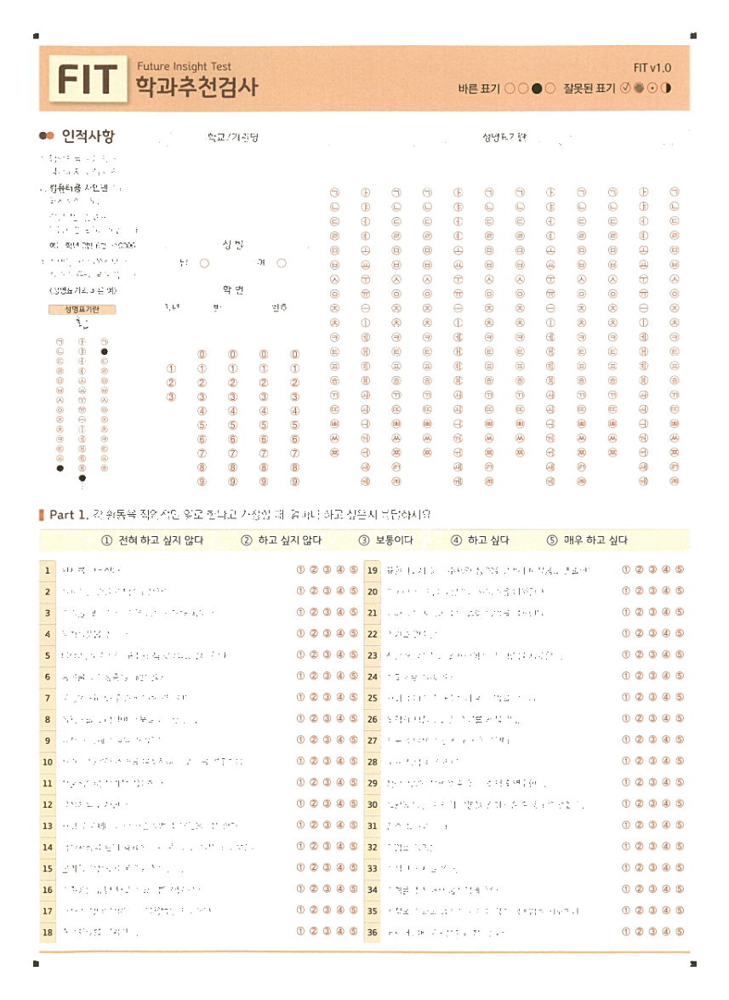

In [307]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

def process_image(image_path):
    # 이미지 읽기
    image = cv2.imread(image_path)
    # BGR을 HSV로 변환
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    
    # 주황색 범위 설정 (이 범위는 필요에 따라 조정 가능)
    lower_orange = np.array([0, 25, 25])
    upper_orange = np.array([50, 255, 255])
    
    # 주황색 마스크 생성
    mask = cv2.inRange(hsv, lower_orange, upper_orange)
    
    # 결과 이미지 초기화 (모두 흰색)
    result = np.full_like(image, 255)
    
    # 주황색 부분만 원본 이미지에서 복사
    result[mask > 0] = image[mask > 0]
    
    # 이미지를 BGR에서 RGB로 변환 (matplotlib로 표시하기 위해)
    result_rgb = cv2.cvtColor(result, cv2.COLOR_BGR2RGB)
    # # 이미지 표시
    # plt.figure(figsize=(15, 15))
    # plt.imshow(result_rgb)
    # plt.axis('off')
    # plt.show()
    
    return result_rgb

# 예시 이미지 경로
image_path = divied_jpg_crop_from_vertex_dir+'_bordered/5547_1.jpg'
process_image(image_path)


./scan/datas/240718_좌표용_testPDF/300dpi/square_bordered/5537_for_canvas_1.jpg


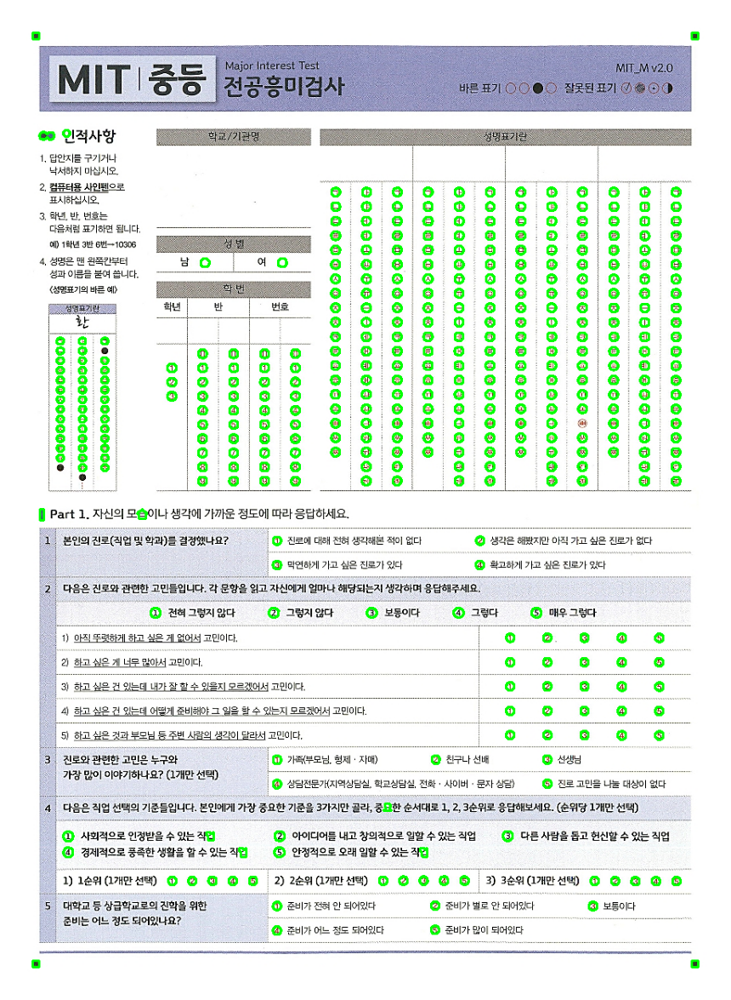

In [488]:
def find_contour(image):
    # 그레이스케일 변환
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    blurred = cv2.GaussianBlur(gray, (1,1), 0)
    _, binary = cv2.threshold(blurred, 220, 255, cv2.THRESH_BINARY_INV)
    contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    # binary = cv2.GaussianBlur(gray, (3,3), 0)
    # edges = cv2.Canny(binary, 50, 100) # 50, 100
    # contours, _ = cv2.findContours(edges.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    return contours, binary

def is_circular(contour):
    area = cv2.contourArea(contour)
    perimeter = cv2.arcLength(contour, True)
    
    if perimeter == 0:
        return False, 0, 0
    
    circularity = 4 * np.pi * (area / (perimeter * perimeter))
    radius = np.sqrt(area / np.pi)
    
    return circularity > 0.5 and 4 < radius < 15, circularity, radius  # 원형


# image_path = divied_jpg_crop_from_vertex_dir+'_bordered/5547_3.jpg'
# image_path = pdf_to_divied_jpg_dir+'/5547_3.jpg'
image_path = divied_jpg_crop_from_vertex_dir+'_bordered/5537_for_canvas_1.jpg'

print(image_path)
image = cv2.imread(image_path)
        
contours, binary = find_contour(image)

# 동그라미 검출 및 그리기
num_circles = 0
for contour in contours:
    is_circle, circularity, radius = is_circular(contour)
    if is_circle:
        cv2.drawContours(image, [contour], -1, (0, 255, 0), 2)
    # else:
    #     # 원형이 아닌 contour를 빨간색으로 표시
    #     cv2.drawContours(image, [contour], -1, (0, 0, 255), 2)

# 결과 이미지 보여주기
plt.figure(figsize=(15, 15))
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()


In [510]:
def find_contour(image):
    # 그레이스케일 변환
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    blurred = cv2.GaussianBlur(gray, (1,1), 0)
    _, binary = cv2.threshold(blurred, 200, 255, cv2.THRESH_BINARY_INV)
    contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    # binary = cv2.GaussianBlur(gray, (3,3), 0)
    # edges = cv2.Canny(binary, 50, 100) # 50, 100
    # contours, _ = cv2.findContours(edges.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    return contours, binary

def is_circular(contour):
    area = cv2.contourArea(contour)
    perimeter = cv2.arcLength(contour, True)
    
    if perimeter == 0:
        return False, 0, 0
    
    circularity = 4 * np.pi * (area / (perimeter * perimeter))
    radius = np.sqrt(area / np.pi)
    
    return circularity > 0.8 and 8 < radius < 15, circularity, radius  # 원형


# image_path = divied_jpg_crop_from_vertex_dir+'_bordered/5547_3.jpg'
# image_path = pdf_to_divied_jpg_dir+'/5547_3.jpg'
image_path = divied_jpg_crop_from_vertex_dir+'_bordered/5537_3.jpg'

print(image_path)
image = cv2.imread(image_path)
        
contours, binary = find_contour(image)

# 동그라미 검출 및 그리기
num_circles = 0
for contour in contours:
    is_circle, circularity, radius = is_circular(contour)
    if is_circle:
        cv2.drawContours(image, [contour], -1, (0, 255, 0), 8)
    # else:
    #     # 원형이 아닌 contour를 빨간색으로 표시
    #     cv2.drawContours(image, [contour], -1, (0, 0, 255), 2)

# 결과 이미지 보여주기
plt.figure(figsize=(15, 15))
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()


5547_1.jpg
1


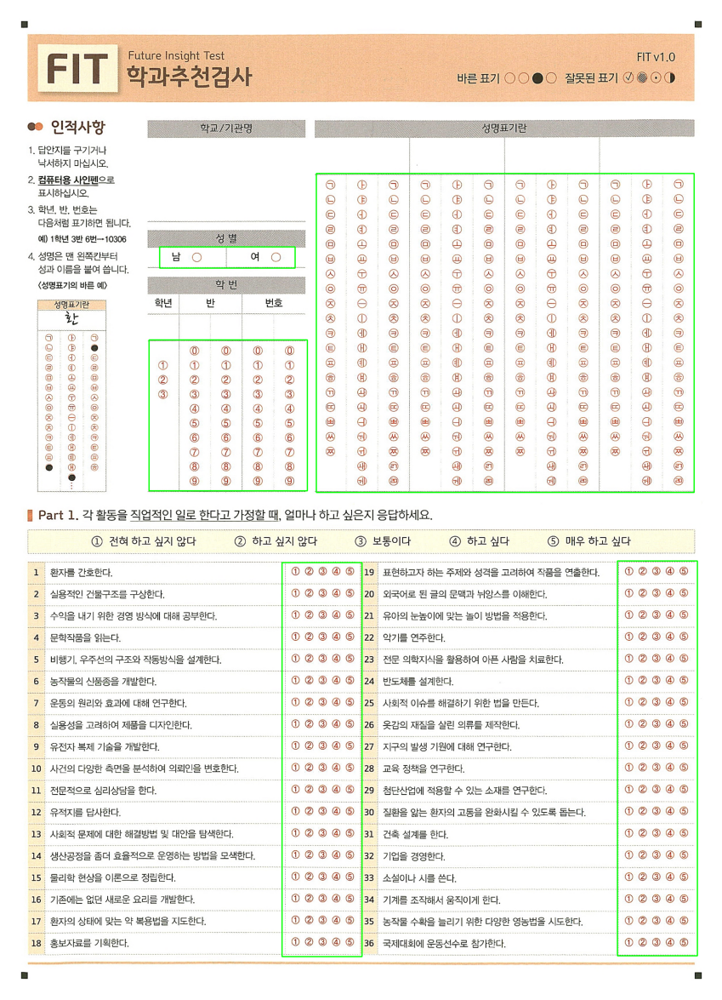

5547_2.jpg
2


KeyError: 2

In [509]:
rects_point_dict = dict()
rects_point_dict['FIT'] = \
   {1: [[200, 307, 366, 333, [0], 'ㅁㄴㅇㄹㄻㄴㅇ', ['1'], '', [0, 0]], [187, 421, 381, 606, [0], 'ㄻㄴㅇㄻㄴㅇ', ['1'], '', [0, 0]], [392, 217, 855, 608, [0], 'ㄻㄴㅇㄹㄴㅇ', ['1'], '', [0, 0]], [350, 694, 448, 1177, [0], 'ㄻㄴㅇㄹㄴㅇ', ['1'], '', [0, 0]], [761, 692, 859, 1176, [0], 'ㄻㄴㅇㄻㅇㄴ', ['1'], '', [0, 0]]]}
        
image_folder = divied_jpg_crop_from_vertex_dir+"_bordered"
for filename in os.listdir(image_folder):
    if (filename.endswith('.jpg')) and ("_page" not in filename) and ("5547" in filename):
        print(filename)
        image_path = os.path.join(image_folder, filename)
        img = cv2.imread(image_path)
        num = int(filename.replace(".jpg", "")[-1])
        print(num)
        for x,y,xw,yh,_,_,_,_,_ in rects_point_dict['FIT'][num]:
            x,y,xw,yh = np.array([x,y,xw,yh])*2-30
            start_point = (x,y)
            end_point = (xw,yh)
            # start_point = (x*2-30,y*2-30)
            # end_point = (xw*2-30,yh*2-30)
            color = (0, 255, 0)  # 사각형 색상 (B, G, R) 형식
            thickness = 2  # 사각형 선 두께
            cv2.rectangle(img, start_point, end_point, color, thickness)
        plt.figure(figsize=(15, 15))
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.axis('off')
        plt.show()